### Read all user data in my dataset


In [6]:
from matrixprofile import *
import stumpy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


In [55]:
%run -i "scriptROC.py"

User 0 9OesCogfhLUKXkUQRhkLq8scAw02
User 1 XGHcBspXfRQj3jD91ty8u2UuT483
User 2 Z8RsBpxhnkebK5fvahVCmfV7icO2
User 3 fLqw0dU8z4brI2Jg74ps3pHqLak1


<Figure size 432x288 with 0 Axes>

In [56]:
df = d[1]

In [57]:
df= df.set_index(['time'], inplace=False)

In [58]:
df

,sugarValue
time,
2020-01-11 15:15:00,106.64028
2020-01-11 15:20:00,103.78260
2020-01-11 15:25:00,100.92492
2020-01-11 15:30:00,98.06724
2020-01-11 15:35:00,95.07348
...,...
2020-01-25 00:05:00,120.18024
2020-01-25 00:10:00,115.96176
2020-01-25 00:15:00,112.81491


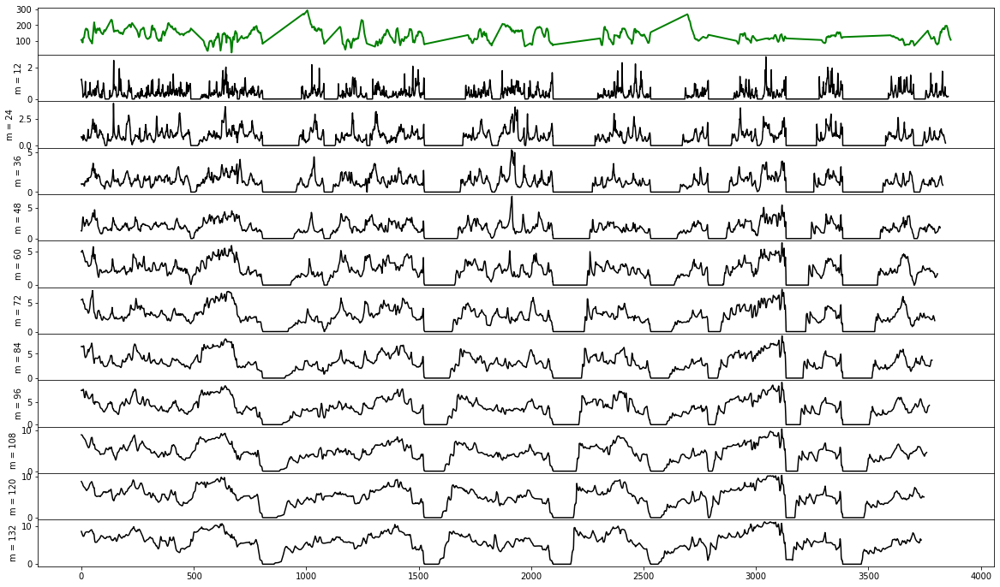

In [59]:


data = df['sugarValue'].values.astype(float)


M = np.arange(12,144,12)
plt.figure(figsize=(20,12))

ax = plt.subplot(len(M)+1,1,1)
plt.plot(data, color='g', linewidth=2)

for i,m in enumerate(M):
    stump_results = stumpy.stump(data, m=m)
    out_df = pd.DataFrame(stump_results, columns=['mp', 'inx', 'left', 'right'])
    MP = [item[0] for item in stump_results]  # Extracting only the Matrix Profile values from the STUMP results
    ax2 = plt.subplot(len(M)+1,1,i+2,sharex=ax)
    ax2.set_ylabel('m = {0}'.format(m))
    plt.plot(MP, color='k')
    
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0)
plt.show()

In [60]:
m=24 # 2 hours
stump_results = stumpy.stump(data, m=m)
out_df = pd.DataFrame(stump_results, columns=['mp', 'inx', 'left', 'right'])
MP = [item[0] for item in stump_results]

In [61]:
S, C = stumpy.allc(out_df['left'].values, out_df['right'].values)
S.sort(key=len,reverse=True)

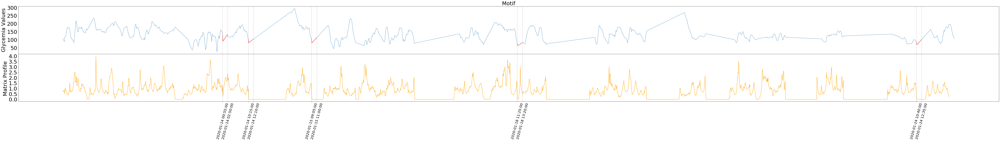

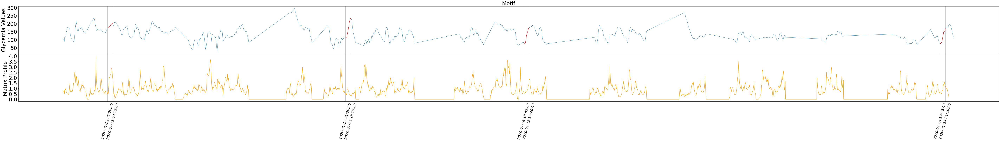

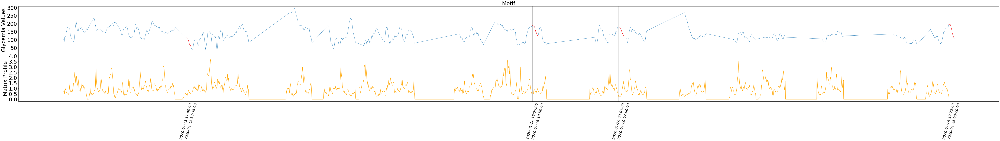

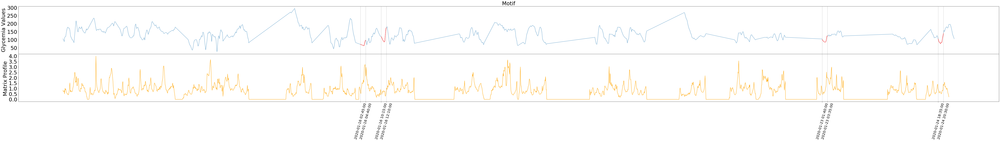

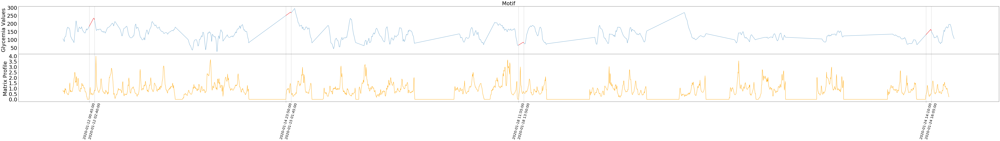

...

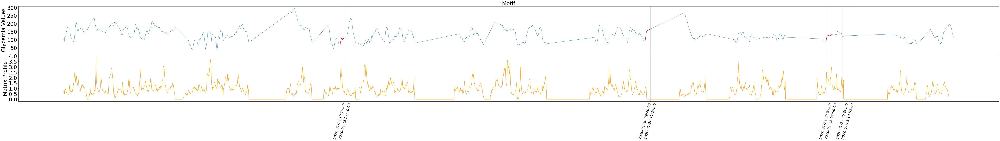

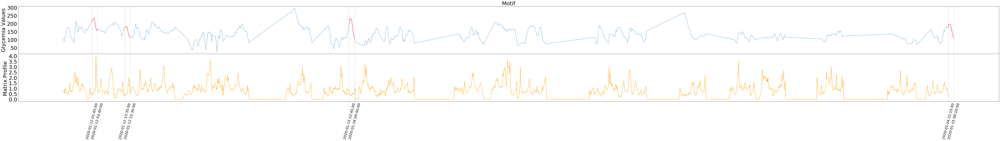

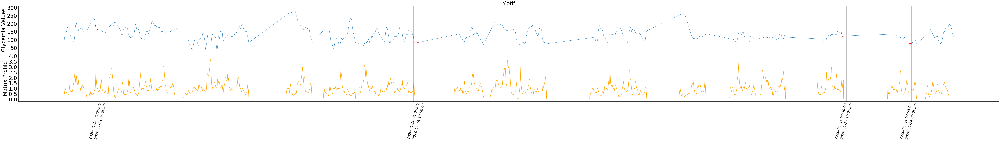

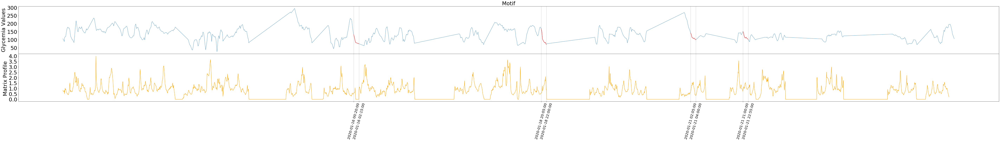

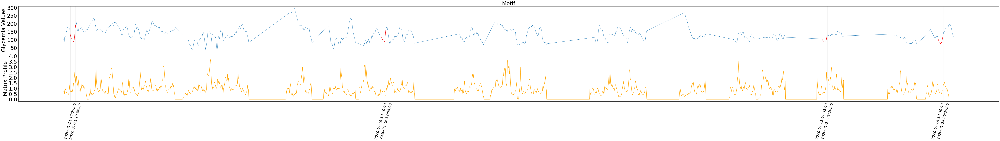

In [62]:
for s in S:
    if len(s)>3:
        plt.figure(figsize=(100,10))
        ax1=plt.subplot(211)
        plt.plot(data, linewidth=1)

        topn = s

        for n in topn:
            plt.plot(np.arange(n,n+m),data[n:n+m], color='r')
            plt.axvline(n, color='grey', linewidth=0.5)
            plt.axvline(n+m-1, color='grey', linewidth=0.5)
            plt.yticks(fontsize=30 )
           

            

        plt.subplot(212, sharex=ax1)
        plt.plot(MP, color='orange')

        for n in topn:
            plt.axvline(n, color='grey', linewidth=0.5)
            plt.axvline(n+m-1, color='grey', linewidth=0.5)
            plt.yticks(fontsize=30 )   
            plt.ylabel('Matrix Profile ',fontsize=30)



        plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0)
        tick_locs = np.append(topn,topn+m-1)
        
        plt.xticks(tick_locs, df.index.strftime('%Y-%m-%d %H:%M:%S').values[tick_locs], rotation=75,fontsize=20 )
        ax1.set_title("Motif", fontsize=30)
        ax1.set_ylabel('Glycemia Values',fontsize=30)
      
        plt.yticks(fontsize=30 )
        plt.savefig("Motif user 1.jpg")
        plt.show()
        
